# Example Jupyter-Notebook for mrbles analysis package

#### *Author: Björn Harink*  
*Last update: 20181224*  
*Set: publication sample data from OSF*  
*Description:* Short pipeline example for mrbles analysis package using shipped sample data.

*General note: use Shift+TAB while cursos is inside () to show Docstrings (Python documentation standards). All Classes and Methods have docstrings (NumPy style).*

# Documentation and Installation

For installation instructions please visit: https://fordycelab.github.io/MRBLEs/_build/html/readme.html#installation.

For documentation please visit: https://fordycelab.github.io/MRBLEs/.

For the source code please visit: https://github.com/FordyceLab/MRBLEs/.

# Load package

The package can then be loaded by using the command `import mrbles`. This should depict:

`Copyright 2015-2018 - The Encoded Beads Project - ThornLab@UCSF and FordyceLab@Stanford  - Version:  x.x.x`

In [2]:
# For development purposes or direct source code use only. 
# Comment out (using: #) or do not execute this cell if neither is the case.
import sys  # Necessary to add folders to Pyhton's PATH
sys.path.insert(0, '../')  # Folder of the cloned source code.

In [2]:
# For development purposes use only!
# import importlib
# importlib.reload(mrbles)
# importlib.reload(mrbles.core)
# importlib.reload(mrbles.data)
# importlib.reload(mrbles.pipeline)
# importlib.reload(mrbles)

In [2]:
import mrbles

## Other package imports

Additional required imports for plotting and data manipulation.

In [3]:
# Data packages
import numpy as np
import pandas as pd
# Plotting packages
from matplotlib import pyplot as plt
import seaborn as sns
# For fancy interactive Plotly graphs
from plotly import tools
import plotly.plotly as py
import plotly.graph_objs as go
# Setting for enabling plots inside Jupyter Notebook
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)

# Using `mrbles` with example data

Download the (assay-images.zip) files used in the [MRBLEs software publication](https://www.biorxiv.org/content/early/2018/08/28/402560): https://osf.io/8kv35/

Set package_path where you unpacked the data files.

In [4]:
package_path = 'C:/DATA/OSF/'

## Load MRBLE library information

Load excel file with information about the the MRBLES library. Please use example file.

Main information that needs to in there are the different ratios (e.g. Dy, Sm, Tm). The code number starts from 0 and is based on the row number. Additional code numbers can be given (for instance when using a partial code set), but this not influence the code calling. All additional columns  provided in the classes are added as information, with a `info.` as prefix.

In [5]:
mrbles_library_info = pd.read_excel(package_path + 'mrbles-library-info.xlsx')

In [6]:
mrbles_library_info

,code,sequence,repeat,info,Dy,Sm,Tm
0,1,AGPHPVIVITGPHEE,1A,WT,0.00000,0.00000,0.00000
1,2,AGIVPIHVTHAPGEE,2A,Scrambled,0.00000,0.00000,0.08449
2,3,AGPHPVIVVTGPHEE,3A,NaN,0.00000,0.00000,0.28960
3,4,AGPHPVIVINGPHEE,4A,NaN,0.00000,0.00000,0.78752
4,5,AGPHPVIAVTGPHEE,5A,NaN,0.00000,0.10822,0.00000
5,6,AGPHPAIVITGPHEE,6A,NaN,0.00000,0.10822,0.08449
6,7,AGPHPAIVITGPHEE,6B,NaN,0.00000,0.10822,0.28960
7,8,AGPHPKIVITGPHEE,7A,NaN,0.00000,0.10822,0.78752
8,9,AGPHPSIVITGPHEE,8A,NaN,0.00000,0.25050,0.00000
9,10,AGPHPVIAVTGPSEE,9A,NaN,0.00000,0.25050,0.08449


## Load sample images using: 'mbrles.Images'

Load the folder paths and filenames.

In [7]:
image_folders = package_path

image_patterns = {"1000 nM": "20170309_CN_HQN106_PAP_1uM800ms_([0-9]|[0-9][0-9])_MMStack_Pos0.ome.tif",
                   "500 nM": "20170309_CN_HQN106_PAP_500nM800msb_([0-9]|[0-9][0-9])_MMStack_Pos0.ome.tif",
                   "250 nM": "20170309_CN_HQN106_PAP_250nM800msb_([0-9]|[0-9][0-9])_MMStack_Pos0.ome.tif",
                   "100 nM": "20170309_CN_HQN106_PAP_100nM800ms_([0-9]|[0-9][0-9])_MMStack_Pos0.ome.tif"
}

flat_field_image = package_path + "\\20180320-FF-Cy5-81im-med-BIN2.tif"

mrbles_images = mrbles.Images(folders=image_folders, file_patterns=image_patterns)

Found 20 files in 1000 nM
Found 18 files in 500 nM
Found 20 files in 250 nM
Found 23 files in 100 nM


Load images in memory.

In [8]:
mrbles_images.load()

By calling the `mrbles_images` object you can see the dataframe.

In [9]:
mrbles_images

{'1000 nM': <xarray.DataArray (f: 20, c: 11, y: 1024, x: 1024)>
array([[[[1956, ..., 2662],
         ...,
         [1790, ..., 2463]],

        ...,

        [[  96, ...,  106],
         ...,
         [ 103, ...,  100]]],


       ...,


       [[[2102, ..., 2444],
         ...,
         [2524, ..., 2313]],

        ...,

        [[ 105, ...,   95],
         ...,
         [  95, ...,   84]]]], dtype=uint16)
Coordinates:
  * c        (c) <U11 'Cy5' 'Brightfield' 'l-435' ... 'l-630' 'l-650' 'l-780'
Dimensions without coordinates: f, y, x, '500 nM': <xarray.DataArray (f: 18, c: 11, y: 1024, x: 1024)>
array([[[[1827, ..., 1997],
         ...,
         [1711, ..., 2143]],

        ...,

        [[  99, ...,  112],
         ...,
         [ 112, ...,   96]]],


       ...,


       [[[1828, ..., 2138],
         ...,
         [1665, ..., 2362]],

        ...,

        [[ 111, ...,  112],
         ...,
         [ 103, ...,  107]]]], dtype=uint16)
Coordinates:
  * c        (c) <U11 'Cy5' 'Bright

Rename channels, if desired.

In [10]:
mrbles_images.rename_channel('Cy5_5%', 'Cy5')

Check channel names by selecting one of the image sets and add `.c`

In [11]:
mrbles_images['1000 nM'].c

<xarray.DataArray 'c' (c: 11)>
array(['Cy5', 'Brightfield', 'l-435', 'l-474', 'l-536', 'l-546', 'l-572',
       'l-620', 'l-630', 'l-650', 'l-780'], dtype='<U11')
Coordinates:
  * c        (c) <U11 'Cy5' 'Brightfield' 'l-435' ... 'l-630' 'l-650' 'l-780'

You can access an individual images like this:

Apply flat-field correction, if desired.

In [12]:
mrbles_images.flat_field(flat_field_image, 'Cy5')

In [13]:
mrbles_images['1000 nM', 3, 'Cy5']

<xarray.DataArray (y: 1024, x: 1024)>
array([[1710., 1853., 1761., ..., 2358., 2331., 2164.],
       [1866., 1909., 1828., ..., 2212., 2442., 2405.],
       [1858., 1906., 1721., ..., 2275., 2330., 2323.],
       ...,
       [1667., 1843., 1787., ..., 2318., 2233., 2285.],
       [1737., 1721., 1919., ..., 2348., 2234., 2065.],
       [1713., 1794., 1683., ..., 2314., 2289., 2236.]])
Coordinates:
    c        <U3 'Cy5'
Dimensions without coordinates: y, x

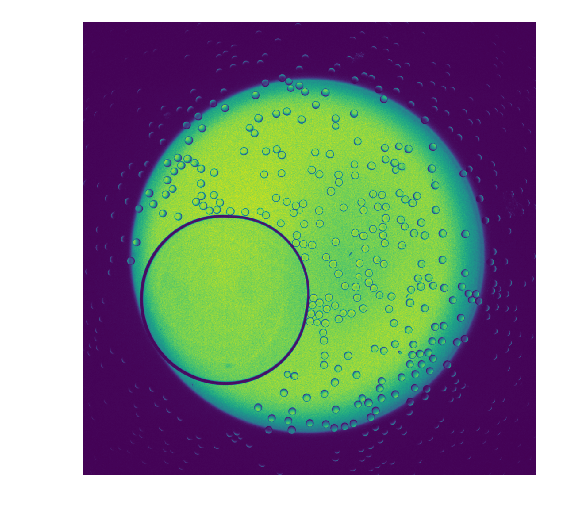

In [14]:
fig = plt.figure(dpi=150)
plt.axis('off')
plt.imshow(mrbles_images['1000 nM', 1, 'Brightfield']);

Crop images to select an ROI, and/or to save memory in subsequent steps. ROI can changed multiple, since full images stay loaded inside object.

In [15]:
mrbles_images.crop_x = slice(90, 930)
mrbles_images.crop_y = slice(100, 940)

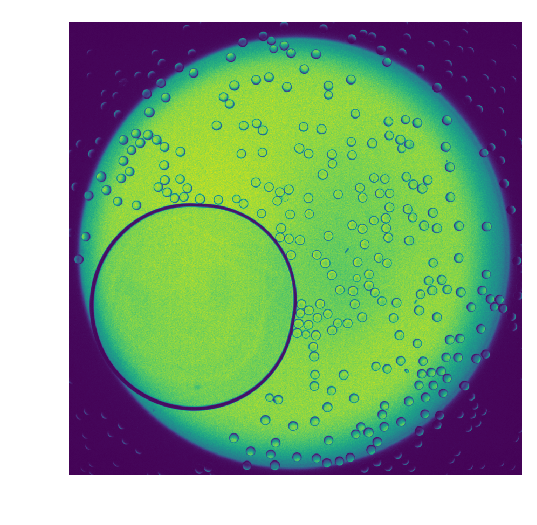

In [16]:
fig = plt.figure(dpi=150)
plt.axis('off')
plt.imshow(mrbles_images['1000 nM', 1, 'Brightfield']);

Shift specific channel images, if alignment is off between filter sets, or differences in optics.

Warning: this is set on the underlying uncropped dataframe (so independent of cropping) and can be changed multiple times. Although inbound pixels when shifting are set to 0. Also, shifting is not absolute but relative. So loading this method multiple times means shifting multiple times.

In [17]:
mrbles_images.shift_channel('Cy5_FF', x_shift=1, y_shift=1)

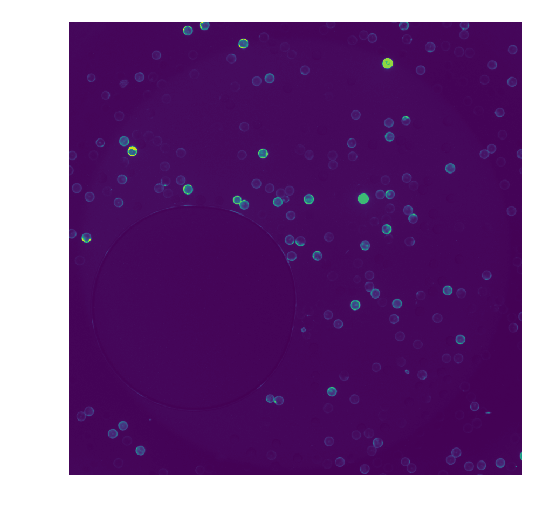

In [18]:
fig = plt.figure(dpi=150)
plt.axis('off')
plt.imshow(mrbles_images['1000 nM', 1, 'Cy5_FF']);

Check flat-field correction before and after.

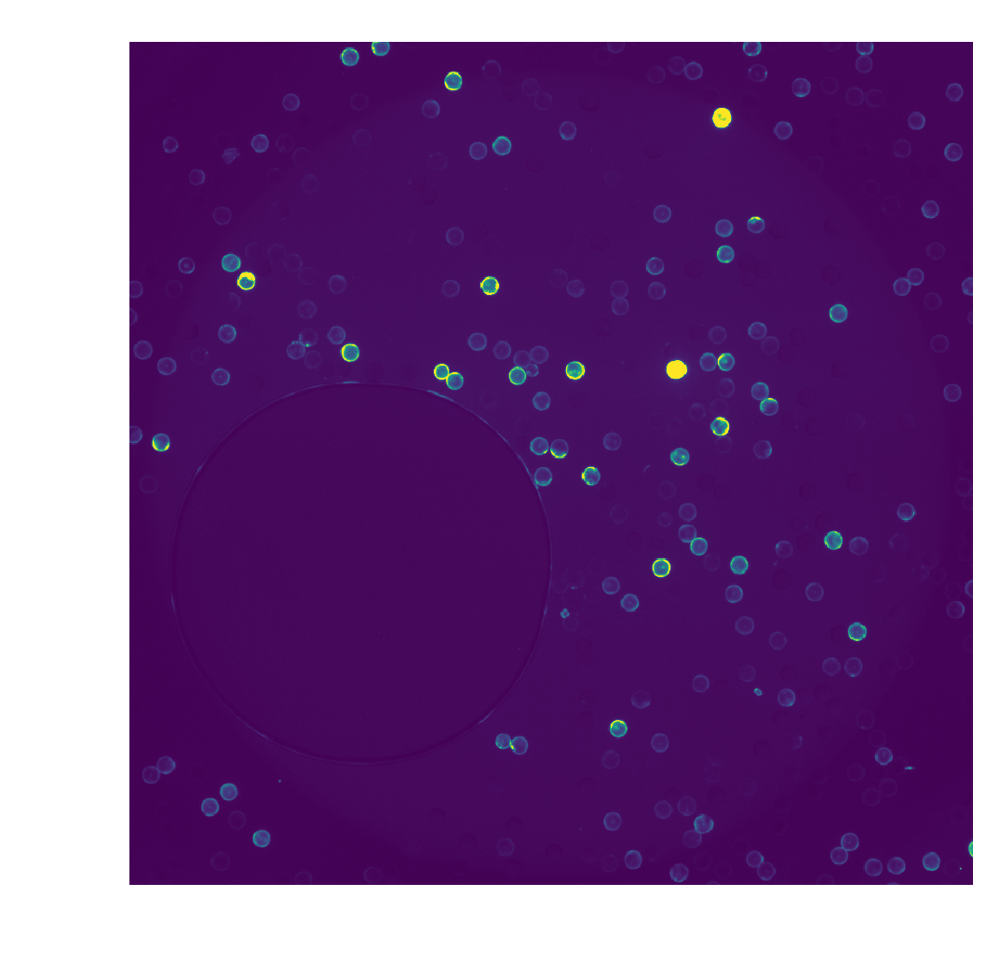

In [19]:
fig = plt.figure(dpi=300)
plt.axis('off')
plt.imshow(mrbles_images['1000 nM', 1, 'Cy5']);

### Alternative image loading method
The alternative method (if not using OME-Tiff micro-manager image stacks) to load images is using Pyhton dictionaries with numpy arrays. As a demonstrator we convert the previously loaded images as numpy arrays.

In [20]:
set_A_np = mrbles_images['1000 nM'].values
set_B_np = mrbles_images['100 nM'].values

In [21]:
set_A_np

array([[[[  120.        ,   118.        ,   123.        , ...,
            120.        ,   120.        ,   109.        ],
         [  122.        ,   117.        ,    95.        , ...,
             99.        ,   121.        ,   124.        ],
         [  110.        ,   101.        ,   109.        , ...,
            120.        ,    96.        ,   116.        ],
         ...,
         [  117.        ,   119.        ,   111.        , ...,
            123.        ,   113.        ,   109.        ],
         [  119.        ,   120.        ,   116.        , ...,
            114.        ,   115.        ,   109.        ],
         [  115.        ,   108.        ,   118.        , ...,
            117.        ,   105.        ,   109.        ]],

        [[ 2191.        ,  2103.        ,  2201.        , ...,
           2585.        ,  2594.        ,  2426.        ],
         [ 2131.        ,  2257.        ,  2167.        , ...,
           2580.        ,  2579.        ,  2704.        ],
        

The order of the numpy array must be file (f), channel (c), Y-axis (y), X-axis (x): `[f, c, y, x]`.

In [22]:
set_A_np.shape

(20, 12, 840, 840)

Insert numpy arrays into Pyhton dictionary.

In [23]:
image_data = {"Set A" : set_A_np,
              "Set B" : set_B_np
}

Create a list of channel names (must be same size as channel dimension size)

In [24]:
channels = ['Cy5', 'Cy5_FF', 'Brightfield', 'l-435', 'l-474', 'l-536', 'l-546', 'l-572', 'l-620', 'l-630', 'l-650', 'l-780']

Load images into mrbles.Images class.

In [25]:
mrbles_images_np = mrbles.Images(data=image_data, channels=channels)

In [26]:
mrbles_images_np

{'Set A': <xarray.DataArray (f: 20, c: 12, y: 840, x: 840)>
array([[[[120., ..., 109.],
         ...,
         [115., ..., 109.]],

        ...,

        [[103., ..., 105.],
         ...,
         [ 98., ..., 102.]]],


       ...,


       [[[139., ..., 120.],
         ...,
         [103., ..., 108.]],

        ...,

        [[140., ..., 104.],
         ...,
         [105., ..., 151.]]]])
Coordinates:
  * c        (c) <U11 'Cy5' 'Cy5_FF' 'Brightfield' ... 'l-630' 'l-650' 'l-780'
Dimensions without coordinates: f, y, x, 'Set B': <xarray.DataArray (f: 23, c: 12, y: 840, x: 840)>
array([[[[121., ..., 103.],
         ...,
         [114., ..., 104.]],

        ...,

        [[114., ...,  94.],
         ...,
         [110., ..., 106.]]],


       ...,


       [[[111., ..., 113.],
         ...,
         [119., ..., 128.]],

        ...,

        [[110., ..., 145.],
         ...,
         [101., ...,  99.]]]])
Coordinates:
  * c        (c) <U11 'Cy5' 'Cy5_FF' 'Brightfield' ... 'l-630' 'l-650

In [27]:
mrbles_images_np['Set A'].c

<xarray.DataArray 'c' (c: 12)>
array(['Cy5', 'Cy5_FF', 'Brightfield', 'l-435', 'l-474', 'l-536', 'l-546',
       'l-572', 'l-620', 'l-630', 'l-650', 'l-780'], dtype='<U11')
Coordinates:
  * c        (c) <U11 'Cy5' 'Cy5_FF' 'Brightfield' ... 'l-630' 'l-650' 'l-780'

### Alternative imaging method

In this image set was imaged in reflection mode instead of transmission mode.

Download the alternative imaging (alt-assay-images.zip) files from: (https://www.biorxiv.org/content/early/2018/08/28/402560): https://osf.io/8kv35/

Set `image_folders_alt` where you unpacked the data files.

In [28]:
image_folders_alt = "C:/DATA/Alt-Set"

image_patterns_alt = {"TEST1": "^.*\.tif"}

mrbles_images_alt = mrbles.Images(folders=image_folders_alt, file_patterns=image_patterns_alt)

Found 36 files in TEST1


In [29]:
mrbles_images_alt.load()

In [30]:
mrbles_images_alt.crop_x = slice(200, 800)
mrbles_images_alt.crop_y = slice(200, 800)

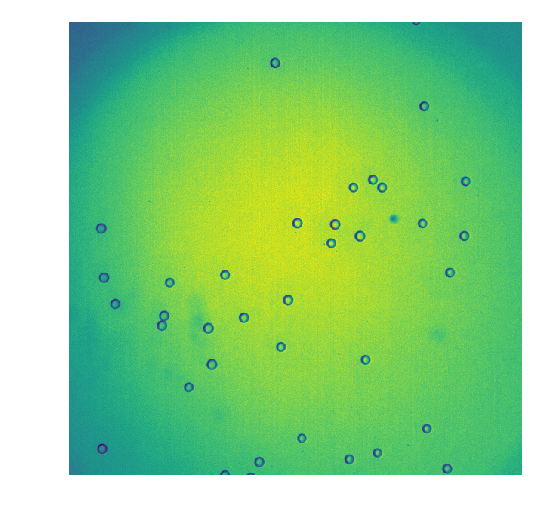

In [31]:
fig = plt.figure(dpi=150)
plt.axis('off')
plt.imshow(mrbles_images_alt['TEST1', 10, 'BF2']);

## Find MRBLEs in brigh-field images using `mrbles.Find`

Only use `find_mrbles.settings.parallelize = True` on workstations with multiple CPU cores (>4), otherwise there is no performance gain. It also uses way more memory since it has spawn multiple Python instances.

In [32]:
find_mrbles = mrbles.Find(bead_size=18, pixel_size = 3.5, border_clear=True, circle_size=350)
find_mrbles.settings.parallelize = True

`find_mrbles.settings` is for internal settings. They all have a default setting, which should work in most cases. If necessary this can be tuned, however. Use `find_mrbles.settings` and then TAB to see a list of options.

Adaptive threshold imaging settings:  
`find_mrbles.settings.thr_block`: The scanning block size.  
`find_mrbles.settings.thr_c`: The leniency.  
Please see link for infomation: https://docs.opencv.org/3.4.0/d7/d4d/tutorial_py_thresholding.html  
Use `find_mrbles.settings.img2bin()` for parameter testing. 

Filtering settings (default values are based on parameter `bead_size`, and therefore in pixels):  
`find_mrbles.settings.area_min`: Minimum area. Default: area x 0.5.  
`find_mrbles.settings.area_max`: Maximum area. Default: area x 1.5.  
`find_mrbles.settings.eccen_max`: Maximum eccentricity (0 being most circle, 1 being least circle). Default: 0.65.

These attributes can be read by calling:  
`find_mrbles.settings.area_min` 

In [33]:
find_mrbles.settings.area_min

63.61725123519331

These attributes can be read by calling:  
`find_mrbles.settings.area_min = 60` 

In [34]:
find_mrbles.find(mrbles_images[:, : , 'Brightfield'])

Bead diameter AVG (converted): 63.30
Bead diameter SD (converted): 2.45
Bead diameter CV (converted): 3.86%
Number of beads in set 100 nM: 2846
Number of beads in set 1000 nM: 1773
Number of beads in set 250 nM: 2248
Number of beads in set 500 nM: 1782
Total number of beads: 8649


Show the final beads found and their dimenions: 

In [35]:
find_mrbles.bead_dims

,set,f,bead_no,label,x_centroid,y_centroid,radius,area,perimeter,eccentricity,diameter,radius_conv,perimeter_conv,diameter_conv,area_conv
0,1000 nM,0,0,3.0,458.765625,115.343750,9.027033,256.0,56.870058,0.112141,18.054067,31.594617,199.045202,63.189233,3136.00
1,1000 nM,0,1,4.0,492.888489,115.730216,9.406920,278.0,59.698485,0.203980,18.813840,32.924221,208.944697,65.848442,3405.50
2,1000 nM,0,2,5.0,480.464000,131.768000,8.920621,250.0,56.284271,0.291844,17.841241,31.222172,196.994949,62.444344,3062.50
3,1000 nM,0,3,6.0,573.661538,139.734615,9.097284,260.0,57.455844,0.149491,18.194567,31.840493,201.095454,63.680986,3185.00
4,1000 nM,0,4,7.0,270.950413,142.859504,8.776730,242.0,56.870058,0.131677,17.553460,30.718556,199.045202,61.437111,2964.50
5,1000 nM,0,5,8.0,559.760956,151.788845,8.938444,251.0,56.870058,0.262325,17.876888,31.284554,199.045202,62.569108,3074.75
6,1000 nM,0,6,12.0,531.863118,160.117871,9.149617,263.0,58.870058,0.207451,18.299235,32.023661,206.045202,64.047322,3221.75
7,1000 nM,0,7,13.0,636.817829,190.631783,9.062227,258.0,58.284271,0.143799,18.124453,31.717793,203.994949,63.435586,3160.50
8,1000 nM,0,8,14.0,345.945736,201.062016,9.062227,258.0,57.941125,0.123520,18.124453,31.717793,202.793939,63.435586,3160.50
9,1000 nM,0,9,15.0,267.346457,206.696850,8.991702,254.0,56.870058,0.116932,17.983405,31.470958,199.045202,62.941916,3111.50


Example dimensions plot.

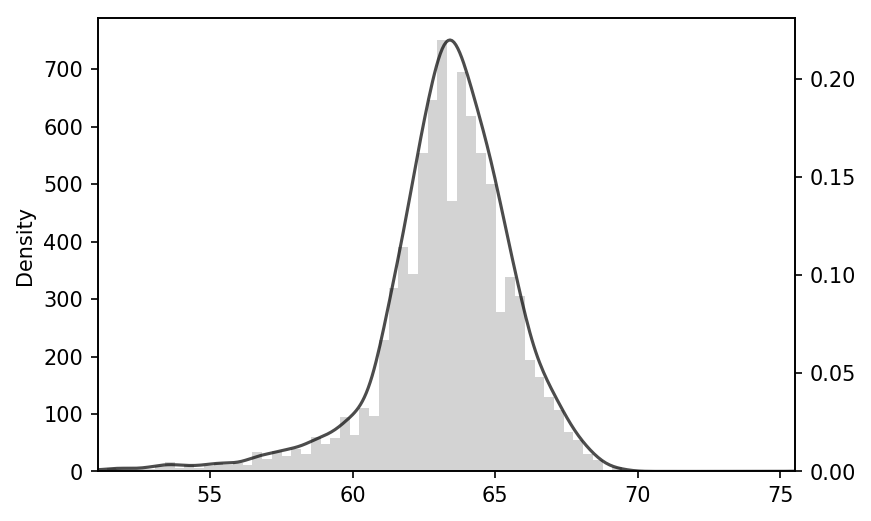

In [36]:
find_mrbles.plot_size_dist()

Plot displaying bright-field image depicting found MRBLEs (crosses).

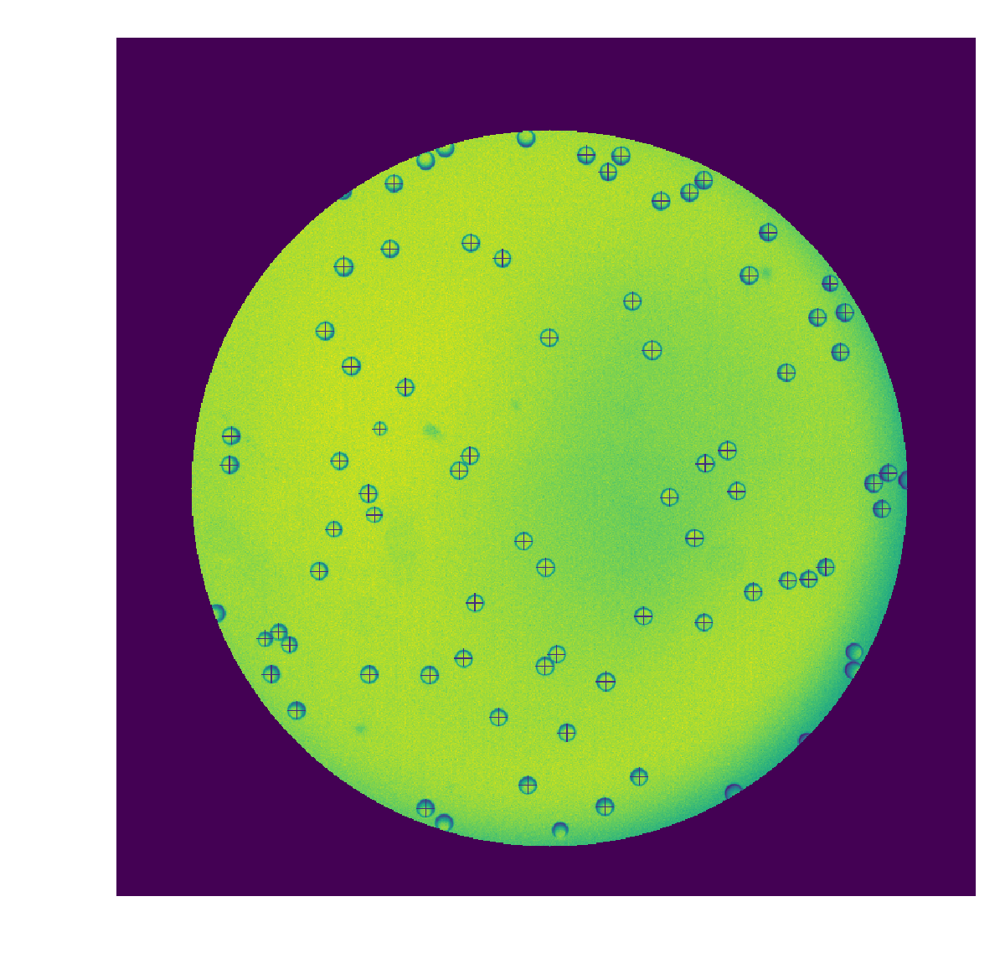

In [37]:
fig = plt.figure(dpi=300)
plt.axis('off')
plt.tight_layout()
plt.imshow(find_mrbles['1000 nM', 0, 'mask_check']);

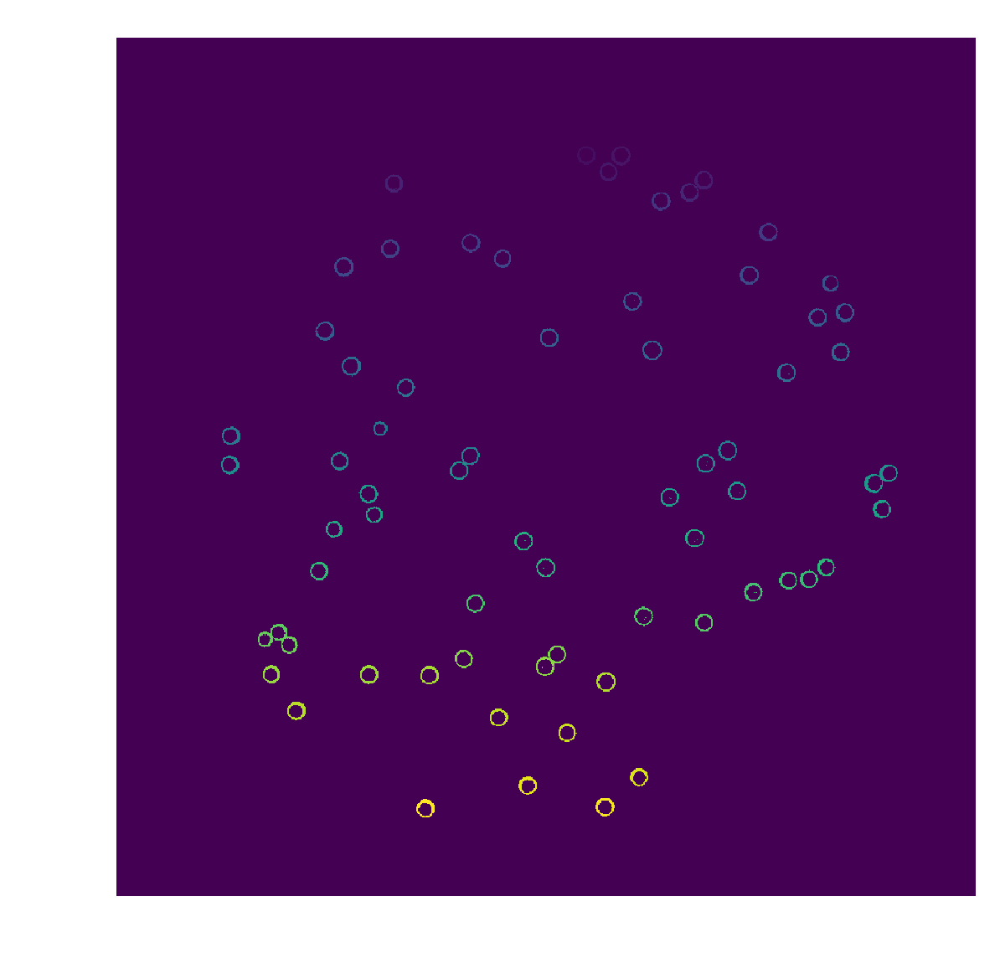

In [38]:
fig = plt.figure(dpi=300)
plt.axis('off')
plt.tight_layout()
plt.imshow(find_mrbles['1000 nM', 0, 'mask_ring']);

### Find beads using Lanthanide channel [In Development]

In [39]:
find_mrbles_eu = mrbles.Find(bead_size=22, border_clear=True)
find_mrbles_eu.settings.parallelize = True

Test settings using test method `.settings.img2bin`:

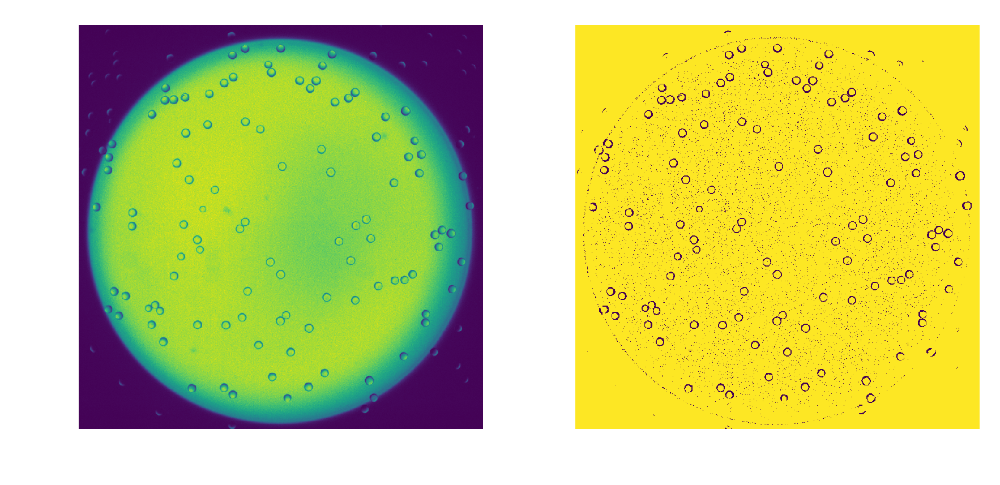

In [40]:
test_img = mrbles_images['1000 nM', 0, 'Brightfield']
test_bin = find_mrbles_eu.settings.img2bin(test_img)

fig, ax = plt.subplots(1,2, dpi=300)
ax[0].imshow(test_img);
ax[0].axis('off')
ax[1].imshow(test_bin);
ax[1].axis('off')
fig.tight_layout()

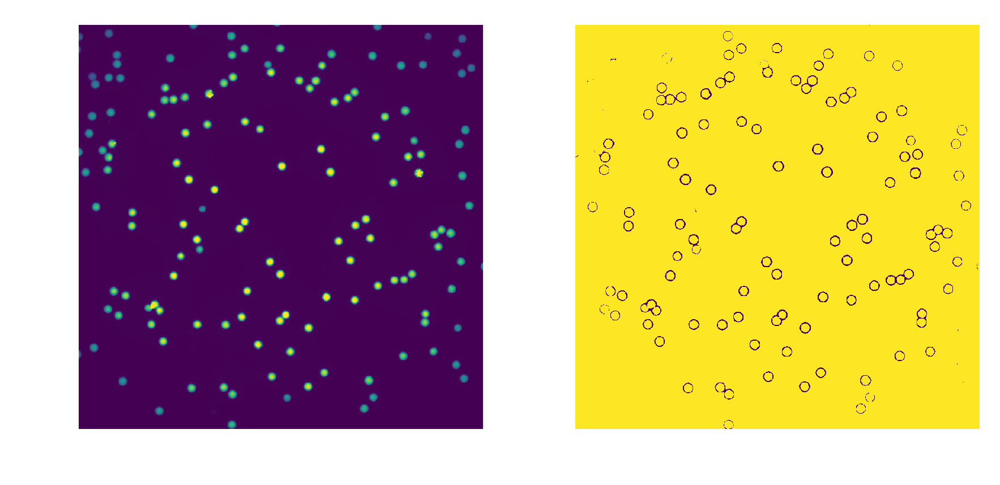

In [41]:
test_img = mrbles_images['1000 nM', 0, 'l-620']
thr_block = 13
thr_c = 17
test_bin = find_mrbles_eu.settings.img2bin(test_img, thr_block=thr_block, thr_c=thr_c)

fig, ax = plt.subplots(1,2, dpi=300)
ax[0].imshow(test_img);
ax[0].axis('off')
ax[1].imshow(test_bin);
ax[1].axis('off')
fig.tight_layout()

Change default settings using optimal settings to adapt for Eu (Em 620 nm) bead finding and run `.find`.

In [ ]:
find_mrbles_eu.settings.thr_block = thr_block
find_mrbles_eu.settings.thr_c = thr_c

In [ ]:
find_mrbles_eu.find(mrbles_images[:, : , 'l-620'])

Bead diameter AVG: 22.04
Bead diameter SD: 0.95
Bead diameter CV: 4.29%
Number of beads in set 100 nM: 3632
Number of beads in set 1000 nM: 2712
Number of beads in set 250 nM: 3072
Number of beads in set 500 nM: 2249
Total number of beads: 11665


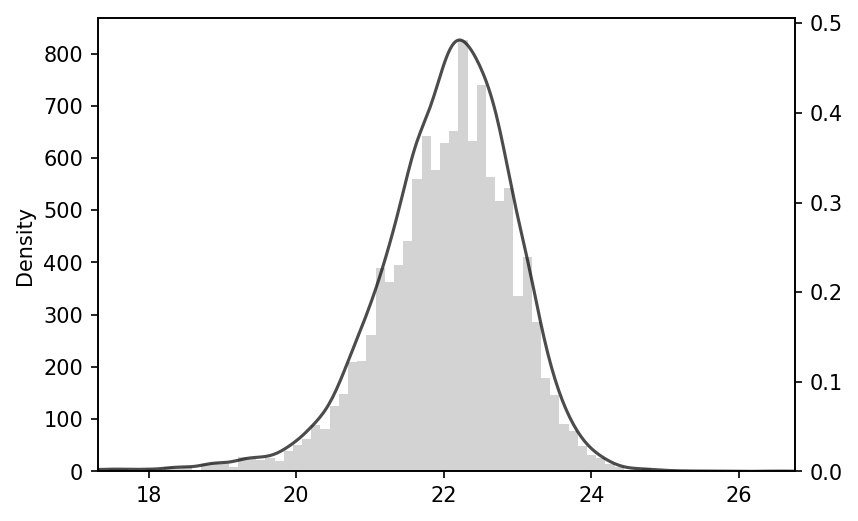

In [ ]:
find_mrbles_eu.plot_size_dist()

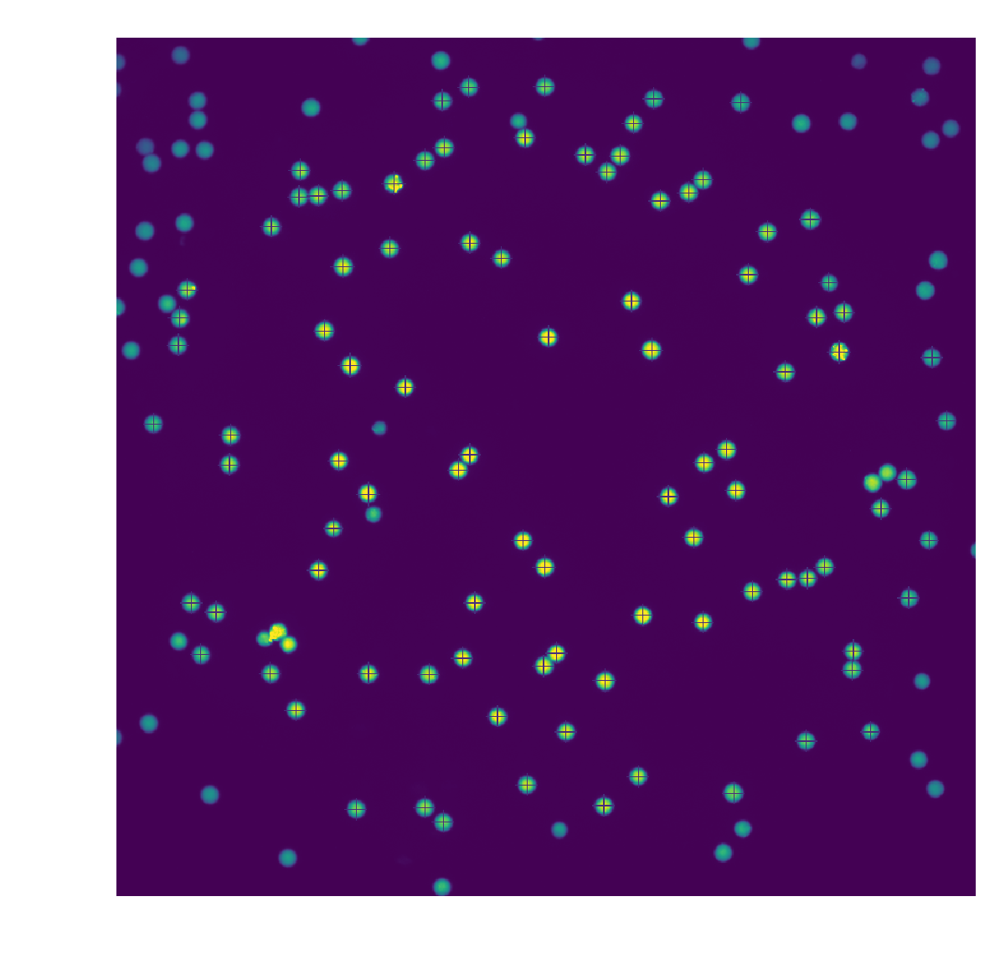

In [ ]:
fig = plt.figure(dpi=300)
plt.axis('off')
plt.tight_layout()
plt.imshow(find_mrbles_eu['1000 nM', 0, 'mask_check']);

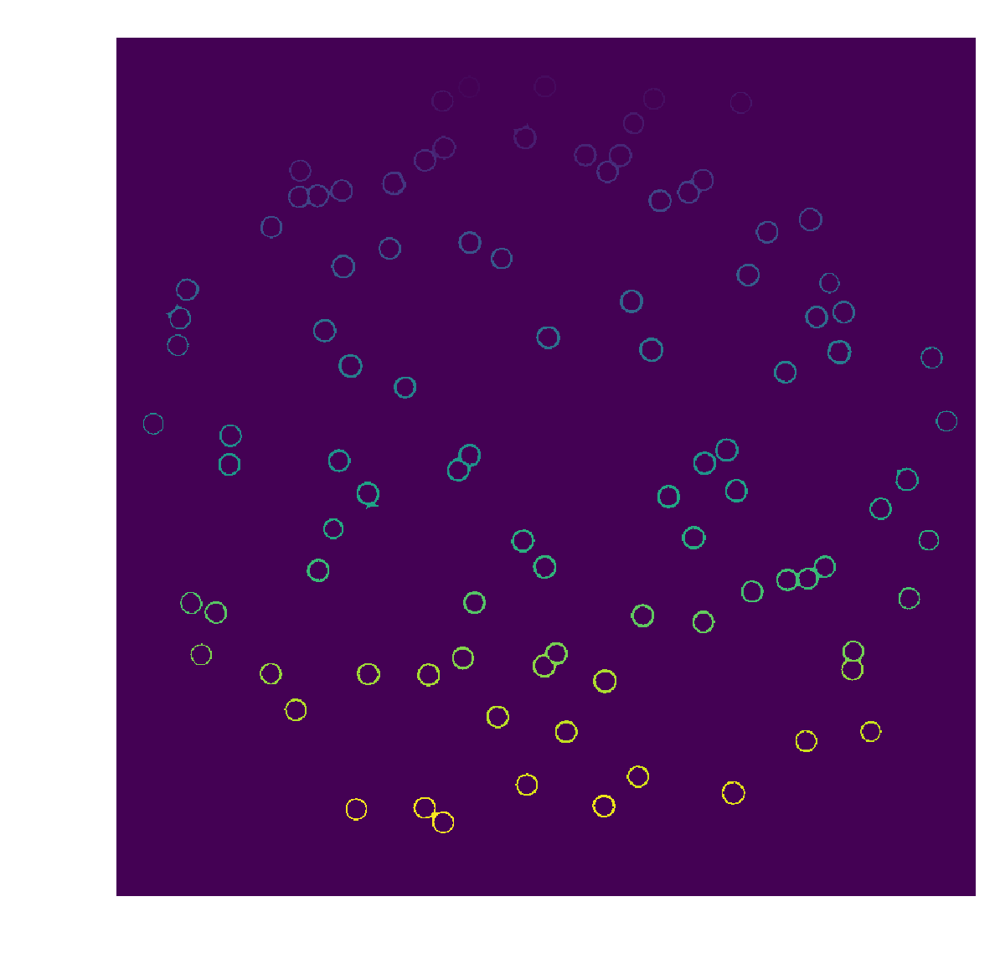

In [ ]:
fig = plt.figure(dpi=300)
plt.axis('off')
plt.tight_layout()
plt.imshow(find_mrbles_eu['1000 nM', 0, 'mask_ring']);

### Find beads using Lanthanide channel with simple circle find method [In Development]

In [ ]:
find_mrbles_eu_circle = mrbles.Find(bead_size=18, border_clear=True, min_r=15, max_r=21, annulus_width=2)
find_mrbles_eu_circle.settings.parallelize = True

In [ ]:
find_mrbles_eu_circle.find(mrbles_images[:, : , 'l-620'])

Bead diameter AVG: 38.32
Bead diameter SD: 6.36
Bead diameter CV: 16.61%
Number of beads in set 100 nM: 10950
Number of beads in set 1000 nM: 9499
Number of beads in set 250 nM: 9473
Number of beads in set 500 nM: 8636
Total number of beads: 38558


In [ ]:
find_mrbles_eu_circle['1000 nM'].c

<xarray.DataArray 'c' (c: 6)>
array(['mask_full', 'mask_ring', 'mask_inside', 'mask_outside', 'mask_bkg',
       'mask_check'], dtype='<U12')
Coordinates:
  * c        (c) <U12 'mask_full' 'mask_ring' ... 'mask_bkg' 'mask_check'

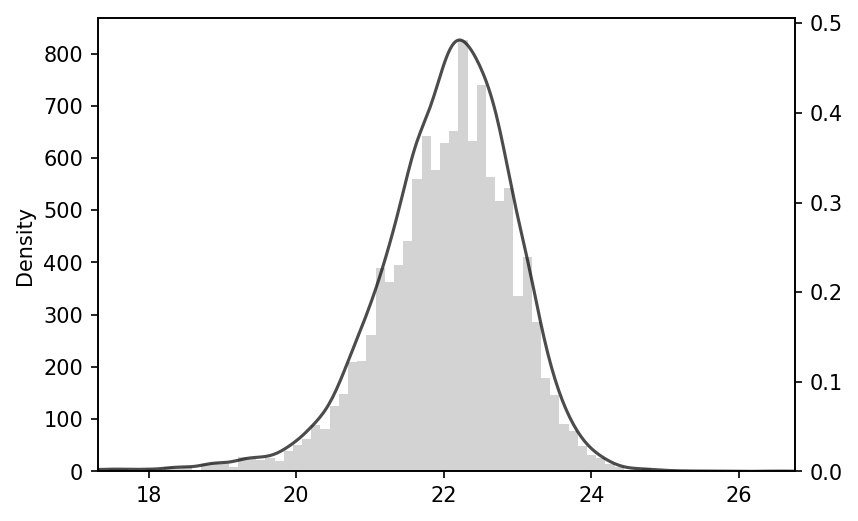

In [ ]:
find_mrbles_eu.plot_size_dist()

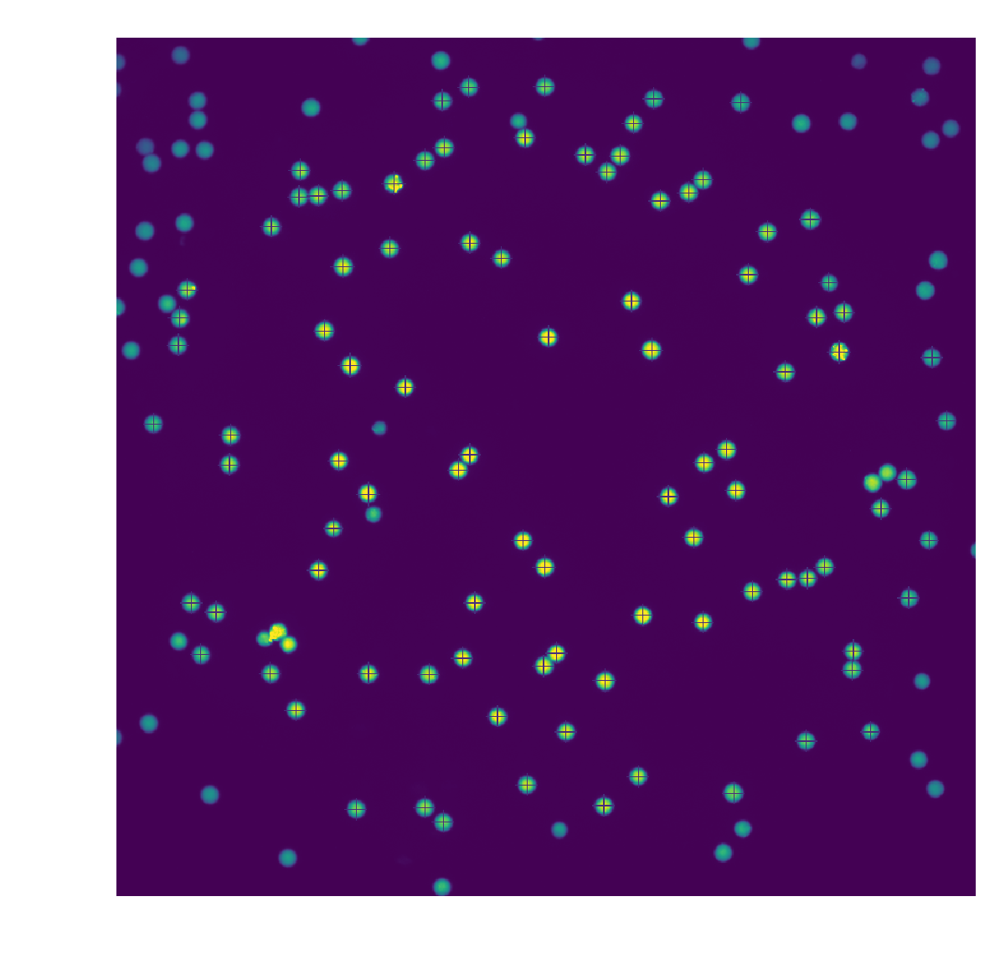

In [ ]:
fig = plt.figure(dpi=300)
plt.axis('off')
plt.tight_layout()
plt.imshow(find_mrbles_eu['1000 nM', 0, 'mask_check']);

### Find beads using alternative image set

In [ ]:
find_mrbles_alt = mrbles.Find(bead_size=13, border_clear=True)
find_mrbles_alt.settings.parallelize = True

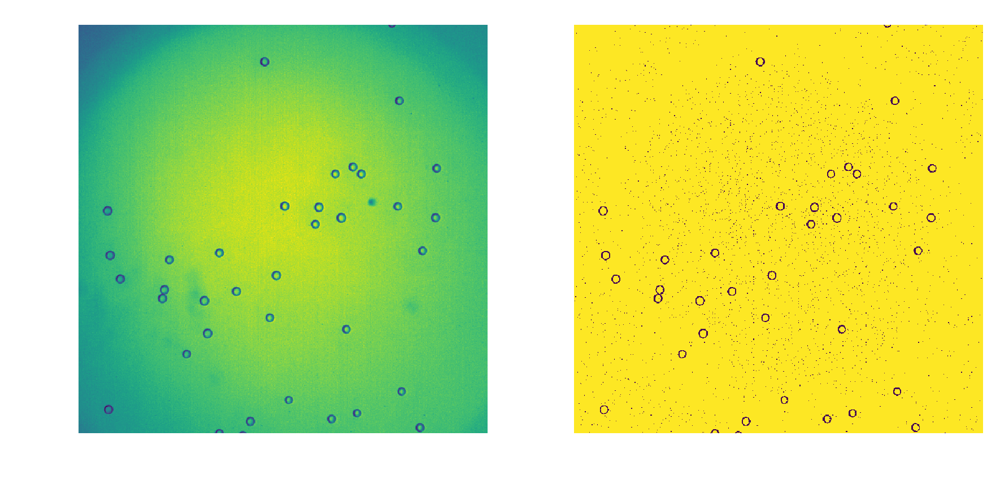

In [ ]:
test_img = mrbles_images_alt['TEST1', 10, 'BF2']
thr_block = 5
thr_c = 11
test_bin = find_mrbles_alt.settings.img2bin(test_img, thr_block=thr_block, thr_c=thr_c)

fig, ax = plt.subplots(1,2, dpi=300)
ax[0].imshow(test_img);
ax[0].axis('off')
ax[1].imshow(test_bin);
ax[1].axis('off')
fig.tight_layout()

In [ ]:
find_mrbles_alt.settings.thr_block = thr_block
find_mrbles_alt.settings.thr_c = thr_c

In [ ]:
find_mrbles_alt.find(mrbles_images_alt[:, : , 'BF2'])

Bead diameter AVG: 12.85
Bead diameter SD: 0.79
Bead diameter CV: 6.16%
Number of beads in set TEST1: 902
Total number of beads: 902


In [ ]:
find_mrbles_alt['TEST1'].c

<xarray.DataArray 'c' (c: 6)>
array(['mask_full', 'mask_ring', 'mask_inside', 'mask_outside', 'mask_bkg',
       'mask_check'], dtype='<U12')
Coordinates:
  * c        (c) <U12 'mask_full' 'mask_ring' ... 'mask_bkg' 'mask_check'

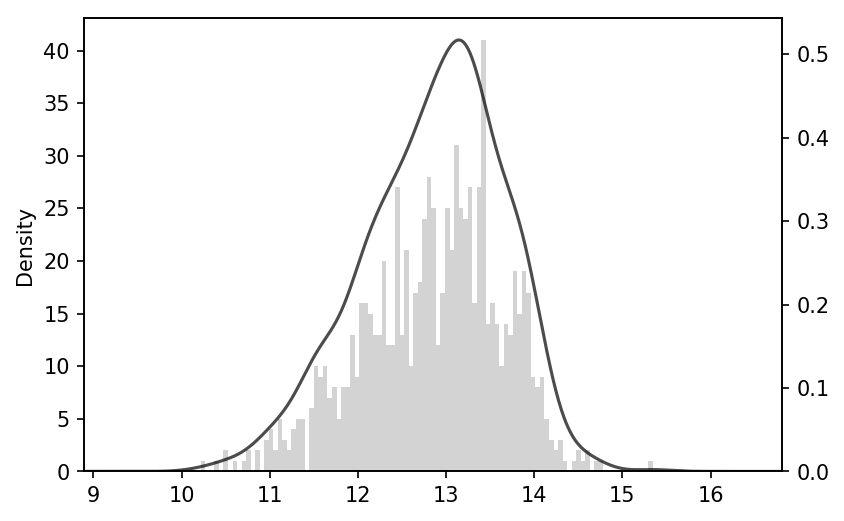

In [ ]:
find_mrbles_alt.plot_size_dist()

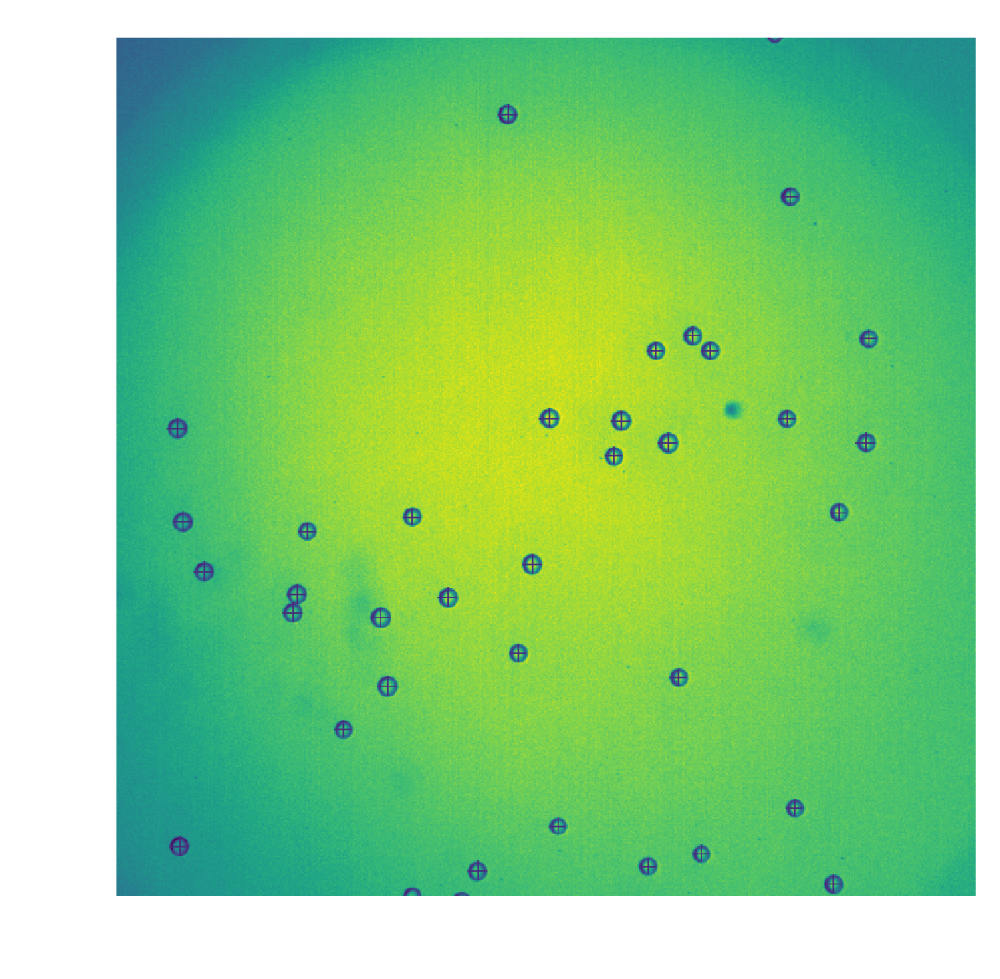

In [ ]:
fig = plt.figure(dpi=300)
plt.axis('off')
plt.tight_layout()
plt.imshow(find_mrbles_alt['TEST1', 10, 'mask_check']);

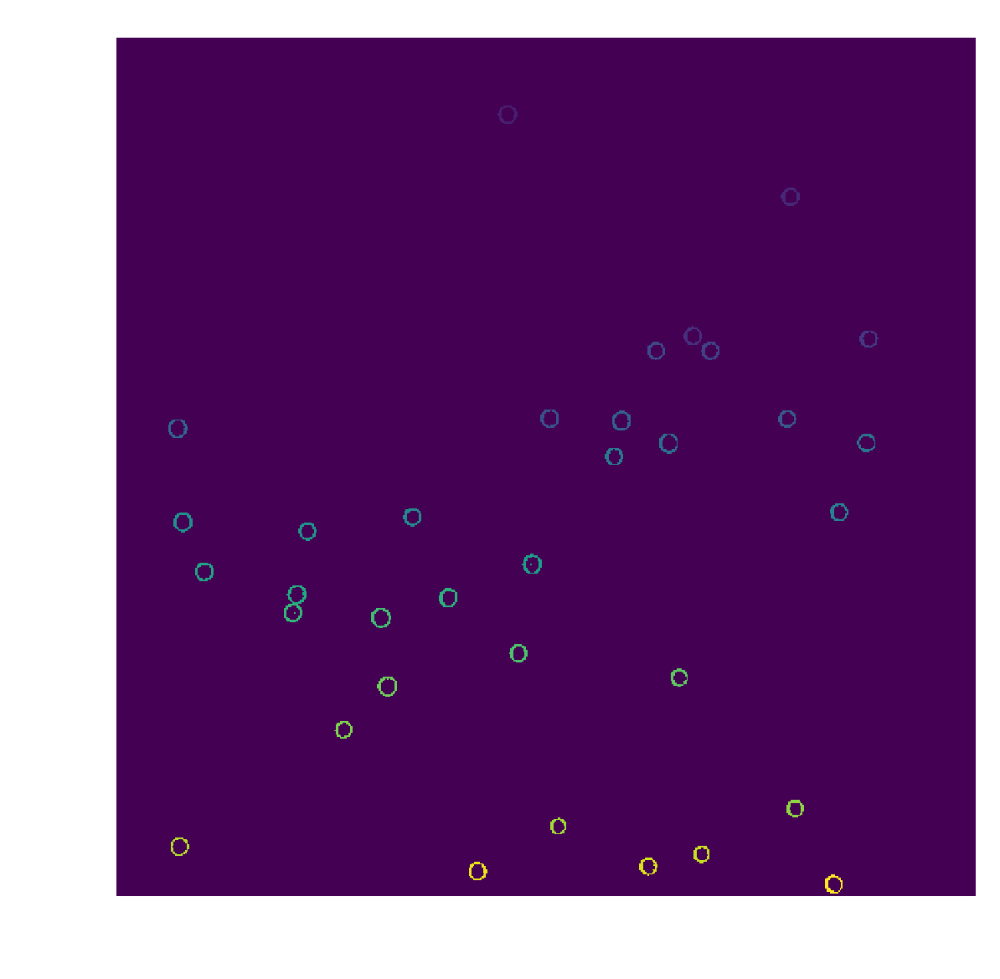

In [ ]:
fig = plt.figure(dpi=300)
plt.axis('off')
plt.tight_layout()
plt.imshow(find_mrbles_alt['TEST1', 10, 'mask_ring']);

## Create reference spectra using: `mrbles.References`

Load all references and add background `bkg` image from the data-set to be invastigated. Choose region where there are no beads

In [ ]:
# Channel settings
DECODE_CHANNELS = slice('l-435','l-780')  # Channel range for decoding
REF_DECODE_CHANNELS = slice('435','780')  # Channel range for decoding
OBJECT_CHANNEL = 'Brightfield'  # Channel for bead finding

# Reference files
REF_FOLDER = {
    "Dy": package_path,
    "Sm": package_path,
    "Tm": package_path,
    "Eu": package_path,
    "bkg": package_path
}

REF_FILES = {"Dy" : "Dy_solo_20160915_3_MMStack_Pos0.ome.tif",
             "Sm" : "Sm_solo_20160915_1_MMStack_Pos0.ome.tif",
             "Tm" : "Tm_1_2_solo_20160915_4_MMStack_Pos0.ome.tif",
             "Eu" : "Eu_solo_20160915_3_MMStack_Pos0.ome.tif",
             "bkg" : "20170309_CN_HQN106_PAP_1uM800ms_1_MMStack_Pos0.ome.tif"  # Always change this!
}

In [ ]:
spec_object = mrbles.References(REF_FOLDER, REF_FILES, OBJECT_CHANNEL, REF_DECODE_CHANNELS, bead_size=32)
spec_object.crop_x = slice(262, 762)
spec_object.crop_y = slice(262, 762)
BACK_ROIx = slice(480, 606)
BACK_ROIy = slice(432, 564)
spec_object.bkg_roi = [BACK_ROIy, BACK_ROIx, slice('l-435','l-780')]

Found 1 files in Dy
Found 1 files in Sm
Found 1 files in Tm
Found 1 files in Eu
Found 1 files in bkg


Load files and generate reference spectra.

In [ ]:
spec_object.load()

Bead diameter AVG: 31.43
Bead diameter SD: 0.56
Bead diameter CV: 1.79%
Number of beads in set Dy: 36
Number of beads in set Eu: 31
Number of beads in set Sm: 63
Number of beads in set Tm: 44
Total number of beads: 174


Display and plot data.

In [ ]:
spec_object.data

,Dy,Sm,Tm,Eu,bkg
channels,,,,,
435,0.004919,0.004616,0.020765,0.005281,0.109937
474,0.251826,0.007631,0.520401,0.008228,0.171851
536,0.004962,0.006964,0.023406,0.012017,0.106312
546,0.001647,0.001547,0.006740,0.004133,0.052854
572,0.630907,0.063180,0.023315,0.007118,0.089097
620,0.001560,0.022172,0.004463,0.470685,0.081244
630,0.073650,0.405518,0.055556,0.439457,0.122622
650,0.015493,0.474073,0.071949,0.041102,0.067049
780,0.015038,0.014301,0.273406,0.011979,0.199034


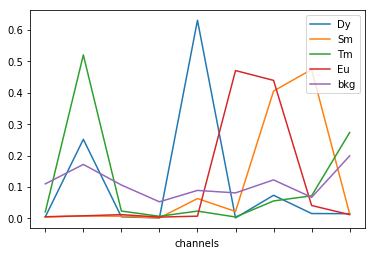

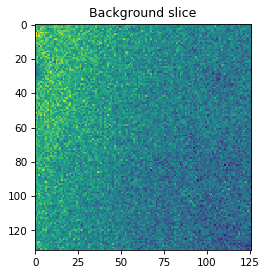

In [ ]:
spec_object.plot()

## Generate spectral unmixed images and ratio images using: `mrbles.Ratio`

In [ ]:
ratio_images = mrbles.Ratio(spec_object)

In [ ]:
ratio_images.get(mrbles_images[:, :, DECODE_CHANNELS], 'Eu',  combine_data=mrbles_images[:, :, ['Cy5_FF']])

See channels generated in `ratio_images` object:

In [ ]:
ratio_images['1000 nM'].c.values.tolist()

['Cy5_FF', 'Dy', 'Dy_ratio', 'Eu', 'Sm', 'Sm_ratio', 'Tm', 'Tm_ratio', 'bkg']

Check inmixed images. Checking `Tm` and `bkg` since they share similar peak at 780 nm. If unmixing is not working properly it should show in the images.

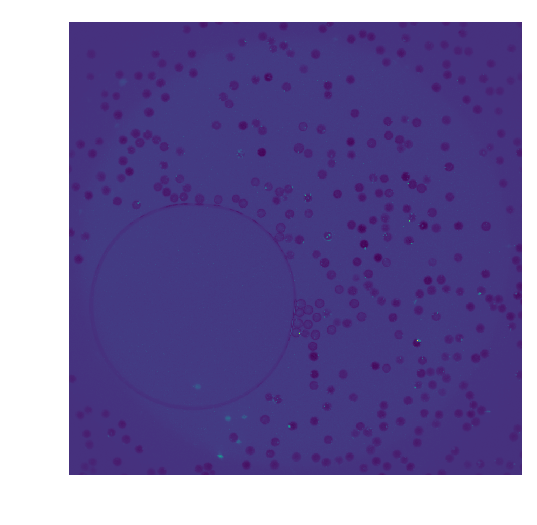

In [ ]:
fig = plt.figure(dpi=150)
plt.axis('off')
plt.imshow(ratio_images['1000 nM', 1, 'bkg']);

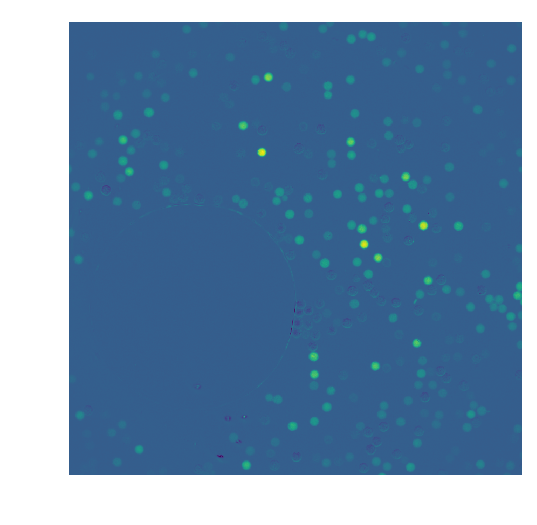

In [ ]:
fig = plt.figure(dpi=150)
plt.axis('off')
plt.imshow(ratio_images['1000 nM', 1, 'Tm']);

## Extract data from each MRBLE using: `mrbles.Extract`

This is the step to use the masks from bead finding and select all channels you want the intensities to be extracted using and select which masks. First, set up the extract class. The default method is using the median (`np.median`) of each bead.

In [ ]:
extract_data = mrbles.Extract()

Select ratio images (for decoding), `Eu` and `bkg` (for filtering), and assay channels (e.g. Cy5). combine_data with bead dimensions.

In [ ]:
extract_data.get(ratio_images[:, :, ['Dy_ratio', 'Sm_ratio', 'Tm_ratio', 'bkg', 'Eu', 'Cy5_FF']], 
                 find_mrbles[:, :, ['mask_ring', 'mask_inside', 'mask_full', 'mask_bkg']],
                 combine_data=find_mrbles.bead_dims)

Filter results using `.filter`, give the +/- SD for background (bkg.mask_full)and reference (Eu.mask_inside):

In [ ]:
extract_data.filter(bkg_factor=2.0, ref_factor=2.0, bkg='bkg.mask_full', ref='Eu.mask_inside')

Pre-filter: 8649
Post-filter: 8247
Filtered: 402 (4.6%)


### Alternative functions
One can pass an alternative funtion through parameter `function`

In [ ]:
extract_data_alt = mrbles.Extract(function=np.sum)

In [ ]:
extract_data_alt.get(ratio_images[:, :, ['Dy_ratio', 'Sm_ratio', 'Tm_ratio', 'bkg', 'Eu', 'Cy5_FF']], 
                     find_mrbles[:, :, ['mask_ring', 'mask_inside', 'mask_full', 'mask_bkg']],
                     combine_data=find_mrbles.bead_dims)

In [ ]:
extract_data_alt.filter()

Pre-filter: 8649
Post-filter: 8165
Filtered: 484 (5.6%)


In [ ]:
extract_data_alt.data

,index,set,f,bead_no,label,x_centroid,y_centroid,radius,area,perimeter,...,Eu.mask_inside,Eu.mask_full,Eu.mask_bkg,Eu.mask_lbl,Cy5_FF.mask_ring,Cy5_FF.mask_inside,Cy5_FF.mask_full,Cy5_FF.mask_bkg,Cy5_FF.mask_lbl,flag
0,0,1000 nM,0,0,3.0,458.765625,115.343750,9.027033,256.0,56.870058,...,1.384545e+07,2.005244e+07,4.910455e+05,3,8.855018e+05,9.955851e+05,1.881087e+06,2.457231e+06,3,False
1,1,1000 nM,0,1,4.0,492.888489,115.730216,9.406920,278.0,59.698485,...,1.579607e+07,2.254028e+07,4.070292e+05,4,6.108613e+05,7.559266e+05,1.366788e+06,1.951151e+06,4,False
2,2,1000 nM,0,2,5.0,480.464000,131.768000,8.920621,250.0,56.284271,...,1.384983e+07,1.956268e+07,7.061676e+05,5,5.010326e+05,5.881515e+05,1.089184e+06,2.669508e+06,5,False
3,3,1000 nM,0,3,6.0,573.661538,139.734615,9.097284,260.0,57.455844,...,1.382790e+07,2.003374e+07,2.240819e+05,6,5.067768e+05,5.831187e+05,1.089896e+06,1.416738e+06,6,False
4,4,1000 nM,0,4,7.0,270.950413,142.859504,8.776730,242.0,56.870058,...,1.301772e+07,2.231329e+07,7.830637e+05,7,5.416390e+05,5.583986e+05,1.100038e+06,3.166704e+06,7,False
5,5,1000 nM,0,5,8.0,559.760956,151.788845,8.938444,251.0,56.870058,...,1.517456e+07,2.154385e+07,4.839669e+05,8,8.228215e+05,1.101281e+06,1.924103e+06,2.086422e+06,8,False
6,6,1000 nM,0,6,12.0,531.863118,160.117871,9.149617,263.0,58.870058,...,1.458558e+07,2.096085e+07,7.174138e+05,12,8.499341e+05,9.980109e+05,1.847945e+06,3.248913e+06,12,False
7,7,1000 nM,0,7,13.0,636.817829,190.631783,9.062227,258.0,58.284271,...,1.214736e+07,1.846217e+07,5.192177e+05,13,4.655151e+05,5.358045e+05,1.001320e+06,3.015022e+06,13,False
8,8,1000 nM,0,8,14.0,345.945736,201.062016,9.062227,258.0,57.941125,...,1.635759e+07,2.173725e+07,5.707255e+05,14,4.685708e+05,6.450120e+05,1.113583e+06,3.100626e+06,14,False
9,9,1000 nM,0,9,15.0,267.346457,206.696850,8.991702,254.0,56.870058,...,1.233491e+07,1.817665e+07,5.342173e+05,15,5.455814e+05,6.357875e+05,1.181369e+06,3.273491e+06,15,False


Or a custom function

In [ ]:
def extract_function(data):
    return np.sum(data)/data.size

In [ ]:
extract_data_custom = mrbles.Extract(function=extract_function)

In [ ]:
extract_data_custom.get(ratio_images[:, :, ['Dy_ratio', 'Sm_ratio', 'Tm_ratio', 'bkg', 'Eu', 'Cy5_FF']], 
                        find_mrbles[:, :, ['mask_ring', 'mask_inside', 'mask_full', 'mask_bkg']],
                        combine_data=find_mrbles.bead_dims)

In [ ]:
extract_data_custom.filter()

Pre-filter: 8649
Post-filter: 8278
Filtered: 371 (4.3%)


In [ ]:
extract_data_custom.data

,index,set,f,bead_no,label,x_centroid,y_centroid,radius,area,perimeter,...,Eu.mask_inside,Eu.mask_full,Eu.mask_bkg,Eu.mask_lbl,Cy5_FF.mask_ring,Cy5_FF.mask_inside,Cy5_FF.mask_full,Cy5_FF.mask_bkg,Cy5_FF.mask_lbl,flag
0,0,1000 nM,0,0,3.0,458.765625,115.343750,9.027033,256.0,56.870058,...,99607.540276,78329.831751,942.505667,3,7568.391587,7162.482461,7347.995616,4716.374437,3,False
1,1,1000 nM,0,1,4.0,492.888489,115.730216,9.406920,278.0,59.698485,...,104609.721166,81080.143663,976.089124,4,4809.931436,5006.136098,4916.503033,4679.018365,4,False
2,2,1000 nM,0,2,5.0,480.464000,131.768000,8.920621,250.0,56.284271,...,102591.301394,78250.722739,1225.985411,5,4356.805175,4356.678071,4356.736539,4634.561814,5,False
3,3,1000 nM,0,3,6.0,573.661538,139.734615,9.097284,260.0,57.455844,...,99481.325294,77052.861088,711.371120,6,4188.238384,4195.098339,4191.905821,4497.579389,6,False
4,4,1000 nM,0,4,7.0,270.950413,142.859504,8.776730,242.0,56.870058,...,105835.140979,92203.671462,1208.431649,7,4551.588540,4539.825703,4545.609908,4886.888596,7,False
5,5,1000 nM,0,5,8.0,559.760956,151.788845,8.938444,251.0,56.870058,...,108389.747790,85832.085632,1094.947673,8,7412.806554,7866.296389,7665.749091,4720.410919,8,False
6,6,1000 nM,0,6,12.0,531.863118,160.117871,9.149617,263.0,58.870058,...,101288.783084,79699.038895,1014.729593,12,7142.303630,6930.631154,7026.406913,4595.351066,12,False
7,7,1000 nM,0,7,13.0,636.817829,190.631783,9.062227,258.0,58.284271,...,88666.859366,71558.796062,739.626421,13,3847.232199,3910.981453,3881.083547,4294.903138,13,False
8,8,1000 nM,0,8,14.0,345.945736,201.062016,9.062227,258.0,57.941125,...,109782.456782,84252.891070,834.394033,14,4298.815042,4328.939322,4316.212397,4533.079448,14,False
9,9,1000 nM,0,9,15.0,267.346457,206.696850,8.991702,254.0,56.870058,...,90697.899253,71561.596097,770.876283,15,4623.571158,4674.907863,4651.058527,4723.652158,15,False


#### Compare Extract methods

In [ ]:
data_median = extract_data[:, 'Cy5_FF.mask_full']
data_median_norm = data_median/data_median.max()
trace1 = go.Histogram(
    x=data_median_norm,
    opacity=0.75,
    name='Median of pixel intenisties per-bead (whole).',
)
data_sum_radius = extract_data_alt[:, 'Cy5_FF.mask_full']/extract_data_alt[:, 'radius']
data_sum_radius_norm = data_sum_radius/data_sum_radius.max()
trace2 = go.Histogram(
    x=data_sum_radius_norm,
    opacity=0.75,
    name='Sum-intensities/bead-radius per-bead (whole).',
)

layout = go.Layout(
    title='Whole bead mask - Per-bead intenisties'
)

data = [trace1, trace2]
layout = go.Layout(barmode='overlay')
fig = go.Figure(data=data, layout=layout)

iplot(fig)

In [ ]:
data_median = extract_data[:, 'Cy5_FF.mask_ring']
data_median_norm = data_median/data_median.max()
trace1 = go.Histogram(
    x=data_median_norm,
    opacity=0.75,
    name='Median of pixel intenisties per-bead (ring).',
)
data_sum_radius = extract_data_alt[:, 'Cy5_FF.mask_full']/extract_data_alt[:, 'radius']
data_sum_radius_norm = data_sum_radius/data_sum_radius.max()
trace2 = go.Histogram(
    x=data_sum_radius_norm,
    opacity=0.75,
    name='Sum-intensities/bead-radius per-bead (whole).',
)

layout = go.Layout(
    title='Ring vs Whole bead mask - Per-bead intenisties'
)

data = [trace1, trace2]
layout = go.Layout(barmode='overlay')
fig = go.Figure(data=data, layout=layout)

iplot(fig)

In [ ]:
data_median = extract_data[:, 'Cy5_FF.mask_ring']
data_median_norm = data_median/data_median.max()
trace1 = go.Histogram(
    x=data_median_norm,
    opacity=0.75,
    name='Median of pixel intenisties per-bead (ring).',
)
data_sum_radius = extract_data_alt[:, 'Cy5_FF.mask_ring']/extract_data_alt[:, 'radius']
data_sum_radius_norm = data_sum_radius/data_sum_radius.max()
trace2 = go.Histogram(
    x=data_sum_radius_norm,
    opacity=0.75,
    name='Sum-intensities/bead-radius per-bead (ring).',
)

layout = go.Layout(
    title='Ring bead mask - Per-bead intenisties'
)

data = [trace1, trace2]
layout = go.Layout(barmode='overlay')
fig = go.Figure(data=data, layout=layout)

iplot(fig)

### Compare Find methods

In [ ]:
extract_data_eu = mrbles.Extract()

In [ ]:
extract_data_eu.get(ratio_images[:, :, ['Dy_ratio', 'Sm_ratio', 'Tm_ratio', 'bkg', 'Eu', 'Cy5_FF']], 
                    find_mrbles_eu[:, :, ['mask_ring', 'mask_inside', 'mask_full', 'mask_bkg']],
                    combine_data=find_mrbles_eu.bead_dims)

In [ ]:
extract_data_eu.data

In [ ]:
data_median = extract_data[:, 'Cy5_FF.mask_ring']
data_median_norm = data_median/data_median.max()
trace1 = go.Histogram(
    x=data_median_norm,
    opacity=0.75,
    name='Median of pixel intenisties per-bead using Brightfield mask (ring).',
)
data_median = extract_data_eu[:, 'Cy5_FF.mask_ring']
data_median_norm = data_median/data_median.max()
trace2 = go.Histogram(
    x=data_median_norm,
    opacity=0.75,
    name='Median of pixel intenisties per-bead using Eu (620 nm) mask (ring).',
)

layout = go.Layout(
    title='Ring bead mask - Per-bead intenisties - Brightfield vs Eu (620 nm)'
)

data = [trace1, trace2]
layout = go.Layout(barmode='overlay')
fig = go.Figure(data=data, layout=layout)

iplot(fig)

In [ ]:
data_median = extract_data[:, 'Cy5_FF.mask_full']
data_median_norm = data_median/data_median.max()
trace1 = go.Histogram(
    x=data_median_norm,
    opacity=0.75,
    name='Median of pixel intenisties per-bead using Brightfield mask (full).',
)
data_median = extract_data_eu[:, 'Cy5_FF.mask_full']
data_median_norm = data_median/data_median.max()
trace2 = go.Histogram(
    x=data_median_norm,
    opacity=0.75,
    name='Median of pixel intenisties per-bead using Eu (620 nm) mask (full).',
)

layout = go.Layout(
    title='Full bead mask - Per-bead intenisties - Brightfield vs Eu (620 nm)'
)

data = [trace1, trace2]
layout = go.Layout(barmode='overlay')
fig = go.Figure(data=data, layout=layout)

iplot(fig)

### Subtracting background signal

Subtract background `Cy5_FF.mask_bkg` from flat-field corrected Cy5 signal from the ring `Cy5_FF.mask_ring` and add to data.

In [ ]:
extract_data.background_subtract('Cy5_FF.mask_ring', 'Cy5_FF.mask_bkg')

In [ ]:
extract_data.data

## Decode MRBLEs using: `mrbles.Decode`

Set up the decode part of the pipeline. Give it the targets as first parameter (only the targets!), and optionally the additional MRBLEs library information.

In [ ]:
mrbles_decode = mrbles.Decode(mrbles_library_info.loc[:, ['Dy', 'Sm', 'Tm']], seq_list=mrbles_library_info)

In [ ]:
mrbles_decode.decode(extract_data.data.loc[:,('Dy_ratio.mask_inside', 'Sm_ratio.mask_inside', 'Tm_ratio.mask_inside')], 
                     combine_data=extract_data.data)

Print codes and plot ratio data.

In [ ]:
mrbles_decode.plot_clusters_3D()

Filtered by confidence.

In [ ]:
mrbles_decode.plot_clusters_3D(min_prob=0.95)

In [ ]:
mrbles_decode.plot_clusters_2D(['Dy', 'Sm'], ci_trace=0.95)

In [ ]:
mrbles_decode.plot_clusters_2D(['Sm', 'Tm'], ci_trace=0.95)

In [ ]:
mrbles_decode.plot_clusters_2D(['Tm', 'Dy'], ci_trace=0.95)

### Decode troube-shooting

The Delta must converge fairly quickly to 0, and steps usually does not exceed more than 15 steps. If you see many steps going up in Delta that usually means it is over-fitting. Always check the final clustering with a 2/3D plot (See below).

This could have many causes:
* Too many missing clusters (where you using a reduced code-set?)
* Clusters too noisy or too many outliers
* Wrong target file...

Solutions:
* Select only the targets (codes) that are actually in the data.
* Filter more in the Extract data step.
* Well you got that one...

Sometimes it can't find all the codes, this can have many causes as well:
* Actual missing clusters
* The ICP step failed (mis-alignment), which is necessary for proper classification
* Wrong target file...

Solutions:
* Select only the targets (codes) that are actually in the data.
* Filter more in the Extract data step.
* Well you got that one...

So basically it all the depends on the ICP step. If all solutions fail you can always try and train this step by flipping on by setting training to `True`:  `mrbles_decode.settings.icp._train = True`. This way the object you instantiated `mrbles_decode` remembers the ICP transformation matric and uses it when you use command `mrbls_decode.decode()`

Procuderes to try (in order):
* Find a (or several) condition(s) within your data-set to align on by trying out sets one by one.
* Train it on the initial test images you used for check the code set after you made it.
* Train it on another data-set with the same code ratios.

If you found a procedure that correctly found the codes. Apply it to the entire set with the same object `mrbls_decode.decode()`.

## Analyze data using `mrbles.Analyze`

Using the gathered data the data can be analyzed to return per-bead and per-code data. Also provided are a per-bead report and an overall quality control report.

In [ ]:
analyze = mrbles.Analyze(mrbles_decode, mrbles_library_info, ratio_images, find_mrbles)

In [ ]:
# If background not calculated using mrbles.Extract, use this:
# analyze.analyze('Cy5_FF.mask_ring', confidence=0.95, bkg_data='Cy5_FF.mask_bkg')

# Else, use this:
analyze.analyze('Cy5_FF.mask_ring_min_bkg', min_prob=0.95)

In [ ]:
analyze.data_per_code

In [ ]:
analyze.data_per_bead

Normalize data with another mrbles data set (in this example the same set us used).

In [ ]:
# analyze.normalize(mrbles_decode.data.loc[(mrbles_decode.data.confidence>=0.95), ('code', 'Cy5_FF.mask_ring')])

Generate a per-bead analysis report. Warning this can take a long time when all beads are included. It gives you an estimated time to generate the report.

In [ ]:
analyze.mrble_report('Cy5_FF', 'bead-report.pdf', set_name='1000 nM', codes=[0,1,2], files=[0,1,2])

Generate an overall QC report with some standard plots. It will generate a PDF, and if the setting `savefig=True` is used it will also store the images separately.

In [ ]:
analyze.qc_report('qc-report.pdf', savefig=False)